<a href="https://colab.research.google.com/github/stenlundmaximilian/ChatChapter/blob/main/Machine_Learning_and_Data_Science_Project2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!gdown https://drive.google.com/uc?id=12KKQMwOAkWhKQYAx7okPwHMRFAG78pN6&export=download

Downloading...
From: https://drive.google.com/uc?id=12KKQMwOAkWhKQYAx7okPwHMRFAG78pN6
To: /content/Lena.zip
100% 48.3k/48.3k [00:00<00:00, 84.6MB/s]


In [ ]:
!unzip Lena.zip

Archive:  Lena.zip
  inflating: Lena.png                


In [ ]:
import matplotlib.pyplot as plt
from matplotlib import image
import numpy as np
import seaborn as sns
from pylab import rcParams
from tqdm import tqdm
from sklearn.metrics import mean_squared_error
import random
import networkx as nx
from sklearn.mixture import BayesianGaussianMixture
from scipy.stats import norm
from scipy.special import digamma
from matplotlib.animation import FuncAnimation

In [24]:
sns.set_theme()
rcParams['figure.figsize'] = 7,7

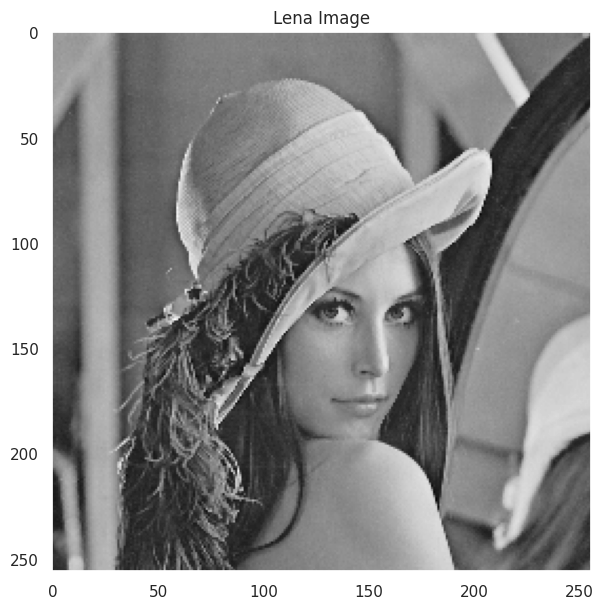

In [ ]:
#plot the image
image_ = image.imread("/content/Lena.png")[:,:,0]
image_dim = image_.shape[0]

def image_plotter(image,title=None,minmax = None,ylines=None,xlines=None):
  with plt.rc_context({"axes.grid":False}):
      if title != None:
        plt.title(title)
      if minmax == None:
        plt.imshow(image,cmap="gray")
      else:
        min,max = minmax
        plt.imshow(image,cmap="gray",vmin=min,vmax=max)

      if xlines != None:
        for i in xlines:
          plt.axvline(x=i, color='red')
      if ylines != None:
        for i in ylines:
          plt.axhline(i,color='red')

image_plotter(image_,"Lena Image")

In [ ]:
image_.shape,np.min(image_),np.max(image_)

((256, 256), 0.015686275, 1.0)

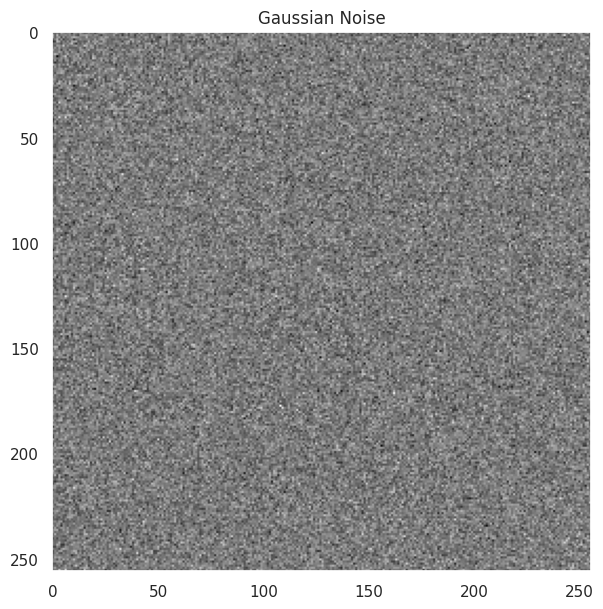

In [ ]:
mean = 0
std_dev = .05

noise_array = np.random.normal(mean, std_dev, (image_dim, image_dim))

image_plotter(noise_array,"Gaussian Noise")

(0.0, 1.0)

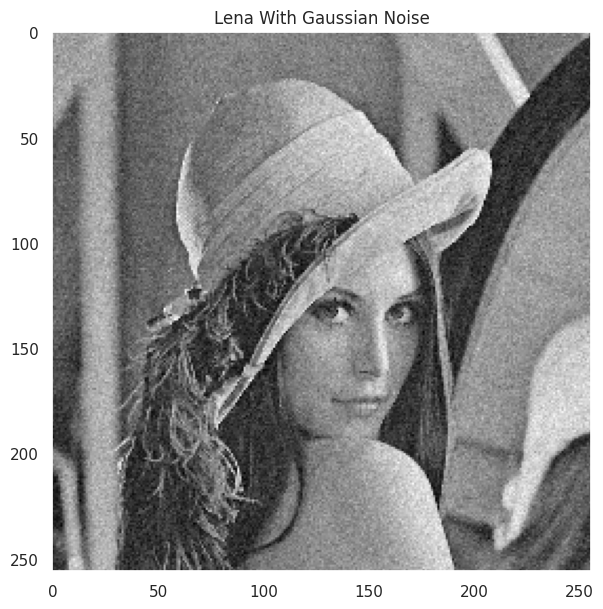

In [ ]:
noisy_image = np.clip(image_+noise_array,0,1)
image_plotter(noisy_image,"Lena With Gaussian Noise")
np.min(noisy_image),np.max(noisy_image)

(0.0, 15.0)

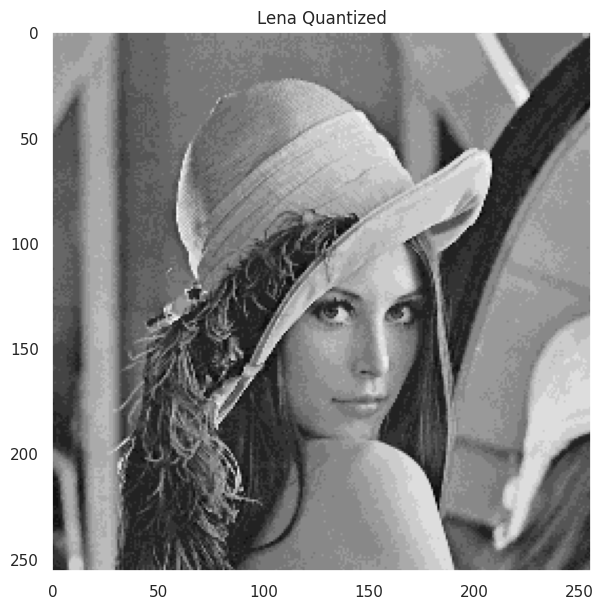

In [ ]:
def image_quantizer(image,bits=3):
  N = 2**bits
  image -= np.min(image)
  image = (image/np.max(image))*N-0.5
  return np.round(np.clip(image,a_min=-0.5+1e-4,a_max=N-0.5-1e-4))

quantized_image = image_quantizer(image_,bits=4)
image_plotter(quantized_image,"Lena Quantized")
np.min(quantized_image), np.max(quantized_image)


(0.0, 15.0)

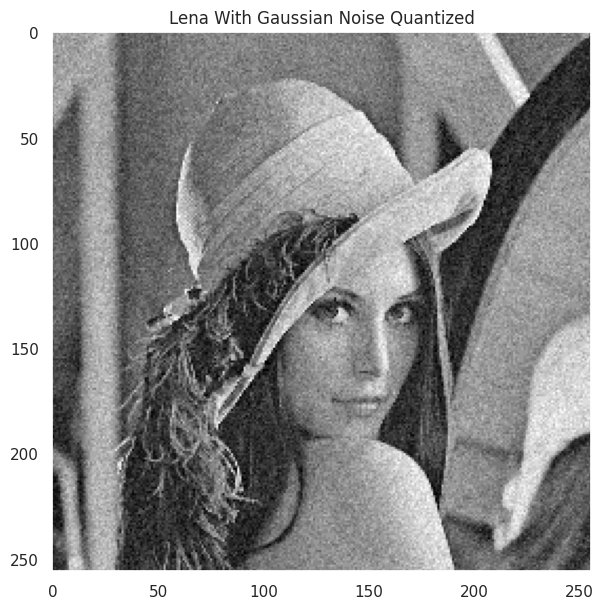

In [ ]:
quantized_noisy_image = image_quantizer(noisy_image,bits=4)
image_plotter(quantized_noisy_image,"Lena With Gaussian Noise Quantized")
np.min(quantized_noisy_image),np.max(quantized_noisy_image)

In [ ]:
mean_squared_error(quantized_image,quantized_noisy_image)

0.835601806640625

In [ ]:
def energy_pixel(image,yi_coordinates,h=0,beta=1,eta=1,bits=3,image_shape=256):
  energies = []
  yi1,yi2 = yi_coordinates
  yi = image[yi1,yi2]
  neighbors = np.array([(yi1+1,yi2),(yi1,yi2+1),(yi1-1,yi2),(yi1,yi2-1)])

  #corners
  if yi1 == 0 and yi2 == 0:
    neighbors = neighbors[[0,1]]
  elif yi1 == image_shape-1 and yi2 == 0:
    neighbors = neighbors[[1,2]]
  elif yi1 == 0 and yi2 == image_shape-1:
    neighbors = neighbors[[0,3]]
  elif yi1 == image_shape-1 and yi2 == image_shape-1:
    neighbors = neighbors[[2,3]]

  #edges
  elif yi1 == 0:
    neighbors = neighbors[[0,1,3]]
  elif yi1 == image_shape-1:
    neighbors = neighbors[[1,2,3]]
  elif yi2 == 0:
    neighbors = neighbors[[0,1,2]]
  elif yi2 == image_shape-1:
    neighbors = neighbors[[0,2,3]]

  w1 = beta/(eta+beta)
  w2 = 1-w1
  mean = w2*yi
  for n in neighbors:
    n1,n2 = n
    mean += w1*image[n1,n2]
  mean = mean/(w1*len(neighbors)+w2)
  return np.round(mean)

restored_image = quantized_noisy_image.copy()

i_values = list(range(image_dim))
j_values = list(range(image_dim))
random.shuffle(i_values)
random.shuffle(j_values)
for i in tqdm(i_values):
  for j in j_values:
    restored_image[i,j] = energy_pixel(restored_image,(i,j),beta=0.2,eta=0.8,bits=4,image_shape=image_dim)

100%|██████████| 256/256 [00:01<00:00, 173.87it/s]


MSE is: 


0.6035919189453125

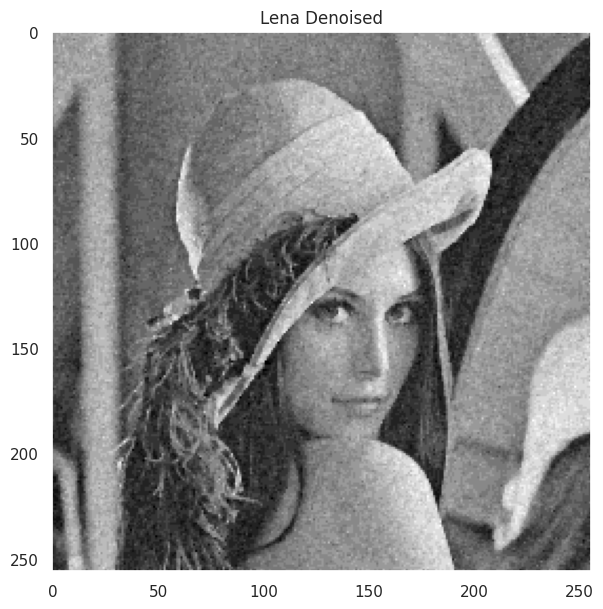

In [ ]:
def pot(x,y):
  #Using a squared potential (i.e. gaussian) would be optimal for this case as we have gaussian noise
  #But this potential seems to work well for any type of noise
    return -np.abs(x-y)**1.5

def E_loc(x,y,i,j, states, h=[2, 0], beta = .75, chi =2):
    E = 0
    if h is None:
        h= np.zeros(states.shape[0])

    E = pot(x[i,j], h[0])*h[1] - (pot(x[i,j],y[i,j]))*chi

    E = E - (pot(x[i,j], x[i+1,j]) + pot(x[i,j], x[i-1,j])
             + pot(x[i,j], x[i,j+1]) + pot(x[i,j], x[i,j-1]))*beta
    return E

def ICM(y, states = [-1, 1], max_iter = int(1e5)):
    x = np.copy(y)

    h = x.shape[1]
    w = x.shape[0]
    prob_maxes = []
    sigma2 = np.var(y)
    for i in range(max_iter):
        energies = []

        #Pick a random pixel to look at, can resample pixels, which is good
        i = np.random.randint(0, w-1)
        j = np.random.randint(0, h-1)
        temp = np.copy(x)
        for s in states:
            temp[i,j] = s
            #We only need to look at the local energy for the pixel that is changed
            energies.append(E_loc(temp, y,i,j,states))
        energies = np.array(energies)
        #If we want Gibbs sampling
        #prob = np.exp(-energies)
        #prob = prob/(np.sum(prob))
        x[i,j] = states[np.argmin(energies)] #Sample from prob for Gibbs instead of ICM

    return x

#Could try to hyperoptimize beta and chi
denoised = ICM(quantized_noisy_image, states = np.arange(2**4))
image_plotter(denoised,"Lena Denoised")
print("MSE is: ")
mean_squared_error(quantized_image,denoised)

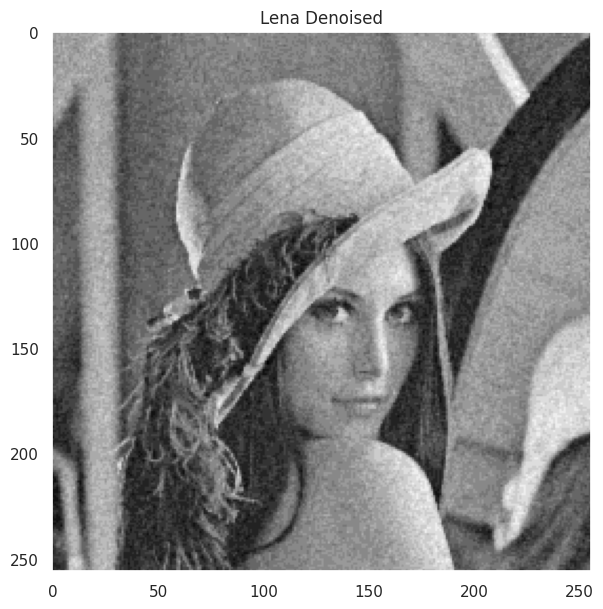

In [ ]:
image_plotter(restored_image,"Lena Denoised")

In [ ]:
mean_squared_error(quantized_image,restored_image)

0.576995849609375

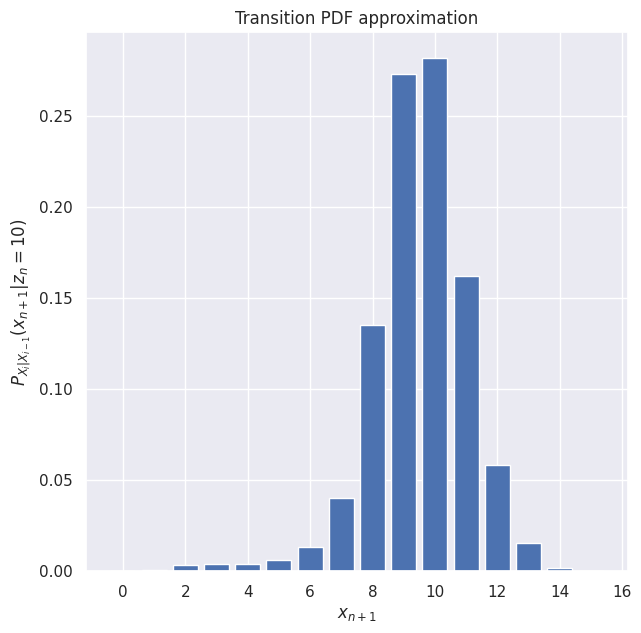

In [ ]:
bits = 4

indexes = []
for i in range(image_dim):
  for j in range(image_dim):
    if i % 2 == 1:
      j = 127-j
    indexes.append((i,j))

pxn_1zn = np.zeros((2**bits,2**bits))

for coordinate_1,coordinate in zip(indexes,indexes[1:]):
  xi_1 = int(quantized_noisy_image[coordinate_1])
  xi = int(quantized_noisy_image[coordinate])
  pxn_1zn[xi_1,xi] += 1

row_sums = pxn_1zn.sum(axis=1)
pxn_1zn = pxn_1zn / row_sums[:, np.newaxis]

def plot_pdf(pdf,title=None,xlabel=None,ylabel=None,bits=3,GMM = None):
  if title != None:
    plt.title(title)
  if ylabel !=None:
    plt.ylabel(ylabel)
  if xlabel != None:
    plt.xlabel(xlabel)
  labels = [i for i in range(2**bits)]
  plt.bar(labels,pdf)

plot_pdf(
          pxn_1zn[10,:],bits=4
         ,ylabel=r"$P_{X_i|X_{i-1}}(x_{n+1}|z_{n}=10)$"
         ,title="Transition PDF approximation"
         ,xlabel=r"$x_{n+1}$"
          )



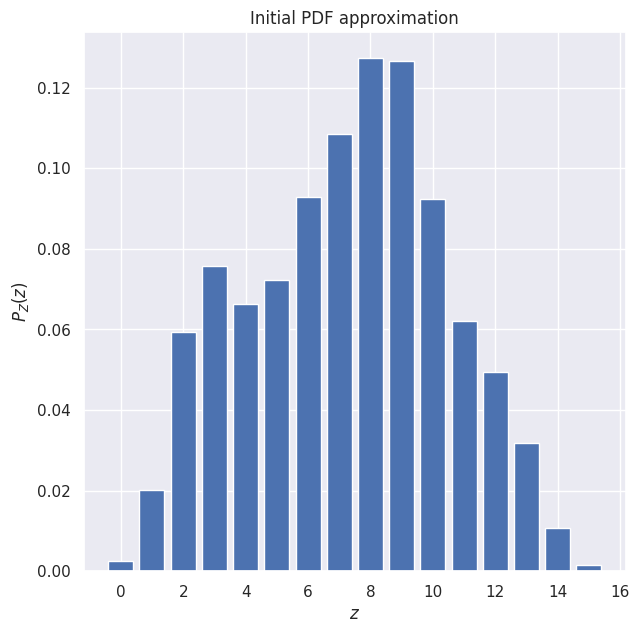

In [ ]:
pz1 = np.zeros((2**bits))

for coordinate in indexes:
  z1 = int(quantized_noisy_image[coordinate])
  pz1[z1] += 1

pz1 = pz1/np.sum(pz1)

plot_pdf(pz1,bits=4,ylabel=r"$P_{Z}(z)$",title="Initial PDF approximation",xlabel=r"$z$")


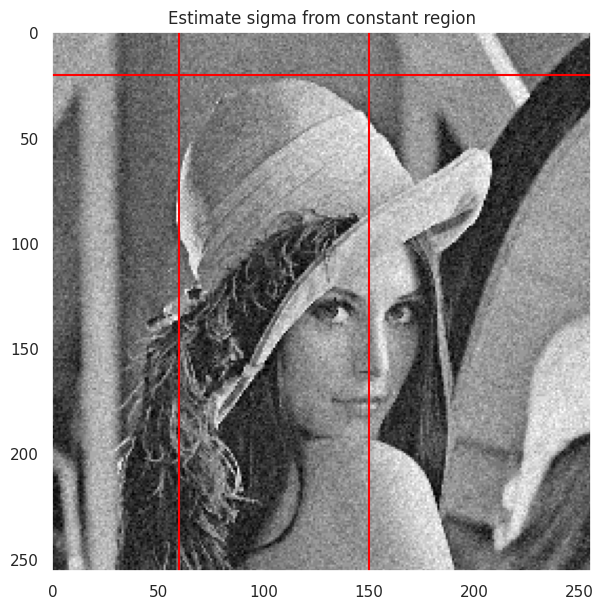

In [ ]:
image_plotter(quantized_noisy_image,xlines=[60,150],ylines=[20],title="Estimate sigma from constant region")
sigma = np.std(quantized_noisy_image[0:20,60:150])

7.457984650484722e-08


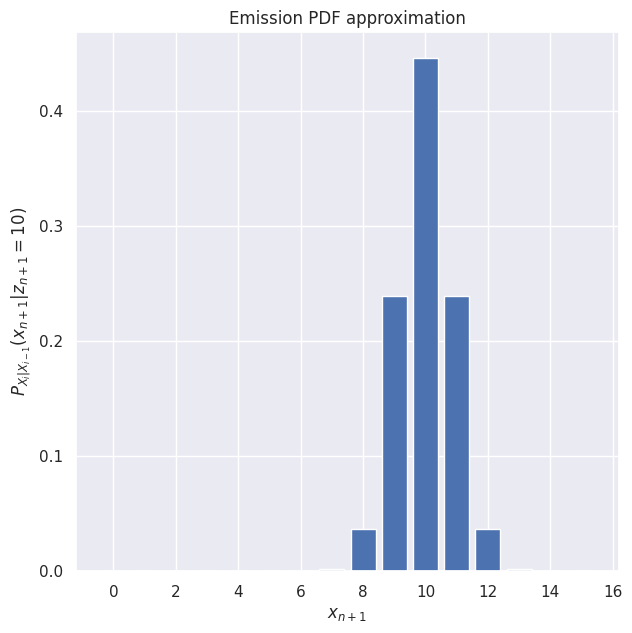

In [ ]:
def gaussian_pdf(x,mu,sigma):
  return (1/(np.sqrt(2*np.pi*sigma**2)) * np.exp(-(1/(2*sigma**2))*(x-mu)**2))


pxn_1zn_1 = np.zeros((2**bits,2**bits))
for i in range(2**bits):
  for j in range(2**bits):
    pxn_1zn_1[i,j] = gaussian_pdf(x=j,mu=i,sigma=sigma)

#normalise rows
row_sums = pxn_1zn_1.sum(axis=1)
pxn_1zn_1 = pxn_1zn_1 / row_sums[:, np.newaxis]

plot_pdf(
    pxn_1zn_1[10,:],bits=4
    ,ylabel=r"$P_{X_i|X_{i-1}}(x_{n+1}|z_{n+1}=10)$"
    ,title="Emission PDF approximation"
    ,xlabel=r"$x_{n+1}$"
)
print(pxn_1zn_1[10,15])



<ipython-input-20-3c70ee0952ad>:7: RuntimeWarning: divide by zero encountered in log
  omega = np.log(pz1) + np.log(pxn_1zn[:,start])
<ipython-input-20-3c70ee0952ad>:14: RuntimeWarning: divide by zero encountered in log
  psis[:,index] = np.argmax(np.log(pxn_1zn[:,xn_1])+omega)
<ipython-input-20-3c70ee0952ad>:17: RuntimeWarning: divide by zero encountered in log
  omega = np.log(pxn_1zn_1[:,xn_1]) + np.max(np.log(pxn_1zn[:,xn_1])+omega)


0.7498779296875

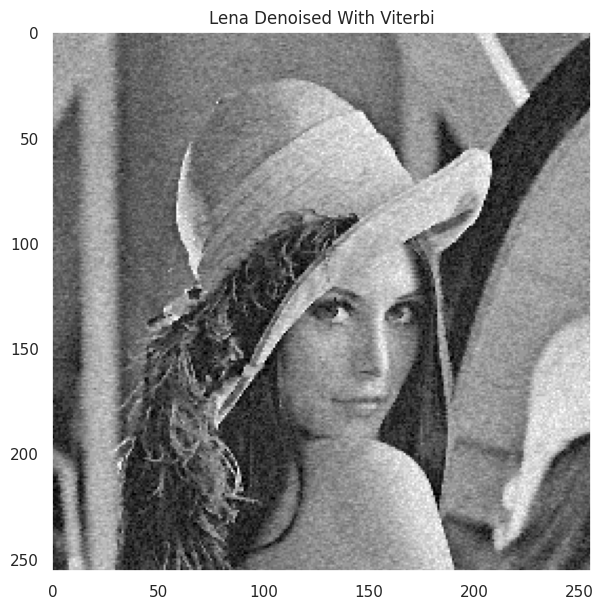

In [ ]:
#Viterbi

#initialization
psis = np.zeros((2**bits,image_dim**2))
omegas = np.zeros((2**bits,image_dim**2))
start = int(quantized_noisy_image[0,0])
omega = np.log(pz1) + np.log(pxn_1zn[:,start])
omegas[:,0] = start

#get messages (omega)
for index,coordinates in enumerate(zip(indexes,indexes[1:])):
  coordinate,coordinate_1 = coordinates
  xn_1 = int(quantized_noisy_image[coordinate_1])
  psis[:,index] = np.argmax(np.log(pxn_1zn[:,xn_1])+omega)

  #equation 13.68
  omega = np.log(pxn_1zn_1[:,xn_1]) + np.max(np.log(pxn_1zn[:,xn_1])+omega)
  omegas[:,index+1] = omega

#get state by backtracking
states=np.zeros((image_dim**2))
state = np.argmax(omegas[:,image_dim**2-1])
states[0] = state
for i in range(1,image_dim**2):
  state = int(psis[:,::-1][state,i])
  states[i] = state

#plot the denoised image
denoised_image = np.zeros((image_dim,image_dim))
for index,coordinate in enumerate(indexes[::-1]):
  denoised_image[coordinate] = states[index]

image_plotter(denoised_image,title="Lena Denoised With Viterbi")
mean_squared_error(denoised_image, quantized_image)

In [ ]:
# Function to calculate Gaussian Mixture PDF
def gaussian_mixture_pdf(x, weights, means, std_devs):
    pdf = 0
    for w, m, s in zip(weights, means, std_devs):
        pdf += w * norm.pdf(x, m, s)
    return pdf

def plot_GMM(alphak,mk,vk,Wk,pz1,plot=True):
  # Parameters for the two Gaussian distributions
  weight1 = alphak[0]/np.sum(alphak)
  mean1 = mk[0]
  std_dev1 = np.sqrt((1/(vk*Wk))[0])

  weight2 = alphak[1]/np.sum(alphak)
  mean2 = mk[1]
  std_dev2 = np.sqrt((1/(vk*Wk))[1])

  # Range of x values
  x_values = np.linspace(0, 15, 1000)

  # Calculate Gaussian Mixture PDF
  pdf_values = gaussian_mixture_pdf(x_values, [weight1, weight2], [mean1, mean2], [std_dev1, std_dev2])

  # Plotting
  plt.plot(x_values, pdf_values, label='Gaussian Mixture PDF',color='red')
  plt.plot(x_values, weight1 * norm.pdf(x_values, mean1, std_dev1), '--', label='Component 1',color='yellow')
  plt.plot(x_values, weight2 * norm.pdf(x_values, mean2, std_dev2), '--', label='Component 2',color='orange')

  plt.title('Gaussian Mixture PDF')
  plt.xlabel('x')
  plt.ylabel('Probability Density')
  plt.legend()
  plot_pdf(pz1,bits=4,ylabel=r"$P_{Z}(z)$",title="Variational Mixture of Gaussians",xlabel=r"$z$")
  if plot == True:
    plt.show()

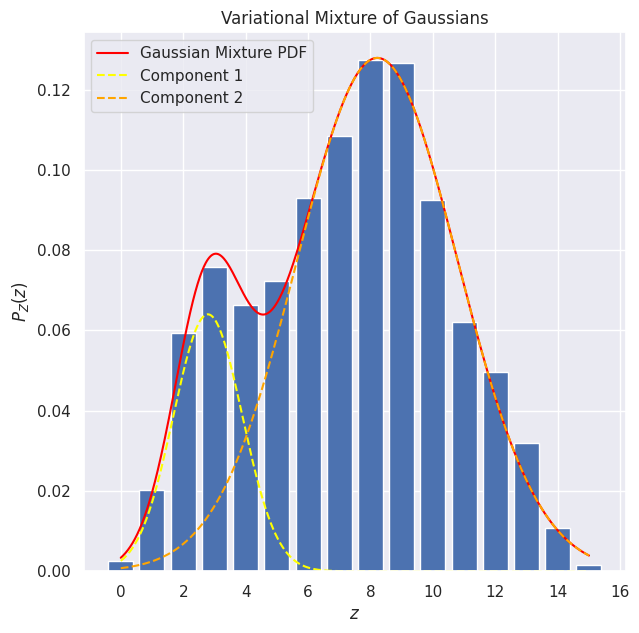

In [ ]:
#Variational Mixture of Gaussians
mu = np.mean(quantized_noisy_image)
sigma = np.mean(quantized_noisy_image)/4

xn = np.zeros((image_dim**2))
for i,coordinate in enumerate(indexes):
  xn[i] = quantized_noisy_image[coordinate]

iterations = 100
alphas = []
ms = []
vs = []
Ws = []
#initialization
alpha0 = np.array([1,1])
beta0 = np.array([1,1])
m0 = np.array([mu-1,mu+1])
W0 = np.array([1/sigma**2,1/sigma**2])
v0 = np.array([1,1])

alphak = alpha0
betak = beta0
mk = m0
Wk = W0
vk = v0

for step in range(iterations):
  #equation 10.64-10.66
  Euklambdak = 1/betak + vk*Wk*(xn[:,np.newaxis]-mk[np.newaxis,:])**2

  lnlambda = digamma(vk/2) + np.log(2) + np.log(Wk)

  lnpik = digamma(alphak) - digamma(np.sum(alphak))

  lambdak = np.exp(lnlambda)
  pik = np.exp(lnpik)

  #equation 10.67
  rnk = pik*np.sqrt(lambdak)*np.exp(-0.5*Euklambdak)
  rnk = rnk/np.sum(rnk,axis=1)[:,np.newaxis]

  #equation 10.51-53
  Nk = np.sum(rnk,axis = 0)
  xbark = np.sum(rnk*xn[:,np.newaxis],axis=0)/Nk
  Sk = np.sum(rnk*((xn[:,np.newaxis]-xbark[np.newaxis,:])**2),axis=0)/Nk

  #equation 10.58
  alphak = alpha0 + Nk

  #equation 10.60-63
  betak = beta0 + Nk
  mk = (beta0*m0 + Nk*xbark)/betak
  Wk =1/(1/W0 + Nk*Sk + (beta0*Nk*(xbark-m0)**2)/(beta0+Nk))
  vk = v0 + Nk

  alphas.append(alphak)
  ms.append(mk)
  vs.append(vk)
  Ws.append(Wk)

plot_GMM(alphak,mk,vk,Wk,pz1)



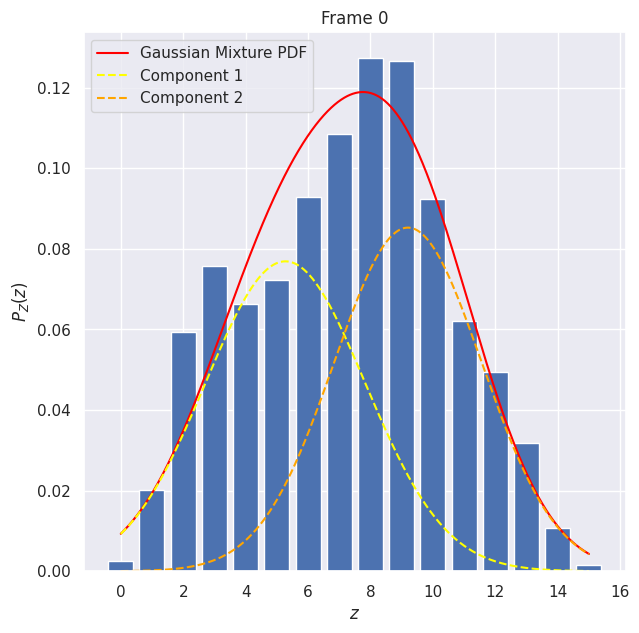

In [ ]:
# Function to update the plot for each frame
def update(frame):
    plt.clf()  # Clear the current figure
    plot_GMM(alphas[frame], ms[frame], vs[frame], Ws[frame], pz1,plot=False)
    plt.title(f'Frame {frame}')

# Set up the figure and axes
fig, ax = plt.subplots()

# Set the total number of frames (adjust this based on your data)
total_frames = len(alphas)  # Assuming alphas is the list of frames

# Create the animation
animation = FuncAnimation(fig, update, frames=total_frames, repeat=False)
# Display the animation in the Colab notebook
from IPython.display import HTML
HTML(animation.to_jshtml())
